In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import cmocean.cm as cmo

import xarray as xr
import hvplot.xarray
import geoviews as gv

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import xroms

/Users/hetl729/miniconda3/envs/compass/lib/python3.9/site-packages/xroms/interp.py:18: UserWarning: xESMF is not installed, so `interpll` will not run.
  warnings.warn("xESMF is not installed, so `interpll` will not run.")


In [3]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:63138")
client

<Client: 'tcp://127.0.0.1:63138' processes=4 threads=8, memory=32.00 GiB>

### Start `dask.distributed.Client`

### Load in `zarr` formatted data. 

Essentially equivalent to `netCDF` or `grib`.

In [4]:
ds = xr.open_zarr('./roms_structured_grid_example.zarr', 
                  consolidated=True, chunks={'ocean_time': 1})
ds

<xarray.Dataset>
Dimensions:     (eta_rho: 120, eta_v: 119, xi_rho: 135, xi_u: 134, ocean_time: 168)
Coordinates: (12/14)
  * eta_rho     (eta_rho) int64 30 31 32 33 34 35 36 ... 144 145 146 147 148 149
  * eta_v       (eta_v) int64 30 31 32 33 34 35 36 ... 143 144 145 146 147 148
    lat_psi     (eta_v, xi_u) float64 dask.array<chunksize=(119, 134), meta=np.ndarray>
    lat_rho     (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    lat_u       (eta_rho, xi_u) float64 dask.array<chunksize=(120, 134), meta=np.ndarray>
    lat_v       (eta_v, xi_rho) float64 dask.array<chunksize=(119, 135), meta=np.ndarray>
    ...          ...
    lon_u       (eta_rho, xi_u) float64 dask.array<chunksize=(120, 134), meta=np.ndarray>
    lon_v       (eta_v, xi_rho) float64 dask.array<chunksize=(119, 135), meta=np.ndarray>
  * ocean_time  (ocean_time) datetime64[ns] 2010-07-01 ... 2010-07-07T23:00:00
    s_rho       float64 ...
  * xi_rho      (xi_rho) int64 270 271 272 273 274 275 ... 400 401 402 403 404
  * xi_u        (xi_u) int64 270 271 272 273 274 275 ... 398 399 400 401 402 403
Data variables:
    f           (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    h           (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    pm          (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    pn          (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    salt        (ocean_time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 120, 135), meta=np.ndarray>
    temp        (ocean_time, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 120, 135), meta=np.ndarray>
    u           (ocean_time, eta_rho, xi_u) float32 dask.array<chunksize=(1, 120, 134), meta=np.ndarray>
    v           (ocean_time, eta_v, xi_rho) float32 dask.array<chunksize=(1, 119, 135), meta=np.ndarray>
Attributes: (12/30)
    CPP_options:       TXLA2_NEST, ANA_BPFLUX, ANA_BSFLUX, ANA_BTFLUX, ANA_SP...
    Conventions:       CF-1.4, SGRID-0.3
    NLM_LBC:           \nEDGE:    WEST   SOUTH  EAST   NORTH  \nzeta:    Che ...
    ana_file:          /scratch/user/d.kobashi/source_code/COAWST/Functionals...
    bry_file_01:       /scratch/user/d.kobashi/projects/hindcasts/projects/tx...
    clm_file_01:       /scratch/user/d.kobashi/projects/hindcasts/projects/tx...
    ...                ...
    svn_rev:           Unversioned directory
    svn_url:           https:://myroms.org/svn/src
    tiling:            018x010
    title:             TXLA ROMS 2-way nesting test
    type:              ROMS/TOMS history file
    var_info:          varinfo.dat

In [5]:
ds.salt

<xarray.DataArray 'salt' (ocean_time: 168, eta_rho: 120, xi_rho: 135)>
dask.array<open_dataset-61093b4ee26ff6d2453747c8423df4dcsalt, shape=(168, 120, 135), dtype=float32, chunksize=(1, 120, 135), chunktype=numpy.ndarray>
Coordinates:
  * eta_rho     (eta_rho) int64 30 31 32 33 34 35 36 ... 144 145 146 147 148 149
    lat_rho     (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    lon_rho     (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
  * ocean_time  (ocean_time) datetime64[ns] 2010-07-01 ... 2010-07-07T23:00:00
    s_rho       float64 ...
  * xi_rho      (xi_rho) int64 270 271 272 273 274 275 ... 400 401 402 403 404
Attributes:
    field:      salinity, scalar, series
    location:   face
    long_name:  salinity
    time:       ocean_time

In [8]:
# ds.salt.isel(ocean_time=100, eta_rho=20, xi_rho=30)
# ds.salt.isel(ocean_time=100, eta_rho=20, xi_rho=30).values
ds.salt[100, 20, 30:]

<xarray.DataArray 'salt' (xi_rho: 105)>
dask.array<getitem, shape=(105,), dtype=float32, chunksize=(105,), chunktype=numpy.ndarray>
Coordinates:
    eta_rho     int64 50
    lat_rho     (xi_rho) float64 dask.array<chunksize=(105,), meta=np.ndarray>
    lon_rho     (xi_rho) float64 dask.array<chunksize=(105,), meta=np.ndarray>
    ocean_time  datetime64[ns] 2010-07-05T04:00:00
    s_rho       float64 ...
  * xi_rho      (xi_rho) int64 300 301 302 303 304 305 ... 400 401 402 403 404
Attributes:
    field:      salinity, scalar, series
    location:   face
    long_name:  salinity
    time:       ocean_time

In [9]:
ds.salt.mean()

<xarray.DataArray 'salt' ()>
dask.array<mean_agg-aggregate, shape=(), dtype=float32, chunksize=(), chunktype=numpy.ndarray>
Coordinates:
    s_rho    float64 ...
Attributes:
    field:      salinity, scalar, series
    location:   face
    long_name:  salinity
    time:       ocean_time

In [10]:
(ds.salt**2).mean().values

array(942.0053, dtype=float32)

In [11]:
# You can also select by the variable associated with the index, like a specific time.
ds.salt.sel(ocean_time='2010-07-04 12:00').hvplot(cmap='cmo.haline', rasterize=True)

:DynamicMap   []
   :Image   [xi_rho,eta_rho]   (salt)

In [12]:
ds.salt.sel(ocean_time='2010-07-04 12:00')

<xarray.DataArray 'salt' (eta_rho: 120, xi_rho: 135)>
dask.array<getitem, shape=(120, 135), dtype=float32, chunksize=(120, 135), chunktype=numpy.ndarray>
Coordinates:
  * eta_rho     (eta_rho) int64 30 31 32 33 34 35 36 ... 144 145 146 147 148 149
    lat_rho     (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    lon_rho     (eta_rho, xi_rho) float64 dask.array<chunksize=(120, 135), meta=np.ndarray>
    ocean_time  datetime64[ns] 2010-07-04T12:00:00
    s_rho       float64 ...
  * xi_rho      (xi_rho) int64 270 271 272 273 274 275 ... 400 401 402 403 404
Attributes:
    field:      salinity, scalar, series
    location:   face
    long_name:  salinity
    time:       ocean_time

In [13]:
tiles = gv.tile_sources.CartoLight
ds.salt.hvplot.quadmesh(x='lon_rho', y='lat_rho', 
                        crs=ccrs.PlateCarree(), 
                        rasterize=True,
                        cmap='cmo.haline') * tiles

:DynamicMap   [ocean_time]
   :Overlay
      .Image.I :Image   [lon_rho,lat_rho]   (salt)
      .WMTS.I  :WMTS   [Longitude,Latitude]

In [14]:
ds.salt.hvplot.quadmesh(x='lon_rho', y='lat_rho', 
                        crs=ccrs.PlateCarree(), 
                        rasterize=True, 
                        projection=ccrs.LambertConformal(-96, 28),
                        coastline=True,
                        cmap='cmo.haline',
                        widget_location='bottom'
                       )

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time since initialization..., options=OrderedDict([('2010-07-01 ...]), value=numpy.datetime64('2010-07-..., width=250)
        [2] HSpacer()

### A publication quality plot using `matplotlib`

/Users/hetl729/miniconda3/envs/compass/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1702: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


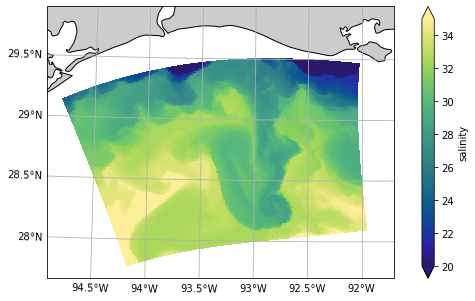

In [17]:
coast_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                        edgecolor='k', facecolor='0.8')

proj = ccrs.LambertConformal(central_longitude=-92, central_latitude=29)
fig, ax = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(10, 5),
                       subplot_kw={'projection': proj})

ds.salt.sel(ocean_time='2010-7-5 00:00').plot(x='lon_rho', y='lat_rho',
                                               transform=ccrs.PlateCarree(),
                                               vmin=20, vmax=35, 
                                               cmap=cmo.haline, ax=ax)
ax.add_feature(coast_10m)
ax.set_extent([-94.9, -91.7, 27.7, 29.9], crs=ccrs.PlateCarree())
ax.set_title('')

gl = ax.gridlines(draw_labels=True, x_inline=False, y_inline=False, 
                  xlocs=np.arange(-94.5,-90, 0.5), ylocs=np.arange(27, 31, 0.5))

# manipulate `gridliner` object to change locations of labels
gl.top_labels = False
gl.right_labels = False

### Examples of analysis using `xgcm` and `xroms`

In [18]:
# load in the 'grid' object that contains grid metrics for differentiation
ds, grid = xroms.roms_dataset(ds)

In [19]:
def to_rho(var):
    if var.dims[-1] != 'xi_rho':
        var = grid.interp(var, 'X', to='center', boundary='extend')
    if var.dims[-2] != 'eta_rho':
        var = grid.interp(var, 'Y', to='center', boundary='extend')
    return var

ds['dsdx'] = to_rho(grid.derivative(ds.salt, 'X'))    # defined at rho-points
ds['dsdy'] = to_rho(grid.derivative(ds.salt, 'Y'))

ds['dudx'] = grid.derivative(ds.u, 'X', boundary='extend')
ds['dvdy'] = grid.derivative(ds.v, 'Y', boundary='extend')
ds['dudy'] = to_rho(grid.derivative(ds.u, 'Y', boundary='extend'))
ds['dvdx'] = to_rho(grid.derivative(ds.v, 'X', boundary='extend'))

derived quantities are grid aware, if you include them in the dataset

In [20]:
ds = ds.unify_chunks()
np.sqrt(ds.dsdx**2 + ds.dsdy**2).hvplot.quadmesh(x='lon_rho', y='lat_rho', 
                        crs=ccrs.PlateCarree(), 
                        rasterize=True, 
                        projection=ccrs.LambertConformal(-96, 28),
                        coastline=True,
                        cmap='cmo.haline',
                        widget_location='bottom'
                       )

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time since initialization..., options=OrderedDict([('2010-07-01 ...]), value=numpy.datetime64('2010-07-..., width=250)
        [2] HSpacer()

### Derived quantities can be quite complex

#### The 'Frontogenesis function' (Hoskins, 1982)

<font size="5">
$ \frac{1}{2}\frac{D}{Dt} \left( \frac{\partial q}{\partial x_j} \right)^2 = - \frac{\partial q}{\partial x_j} \frac{\partial u_i}{\partial x_j} \frac{\partial q}{\partial x_i}$
</font>

In [21]:
ds['Ddelq2'] = -( ds.dsdx*(ds.dudx*ds.dsdx + ds.dvdx*ds.dsdy)
                 +ds.dsdy*(ds.dudy*ds.dsdx + ds.dvdy*ds.dsdy) )
ds.Ddelq2.name = 'Frontogenesis function'

# Unifying chunks needs to happen often after analysis steps that reshape grids
ds = ds.unify_chunks()

You can explore derived variables in the same way as before

In [22]:
np.log10(ds.Ddelq2).hvplot.quadmesh(x='lon_rho', y='lat_rho', 
                        crs=ccrs.PlateCarree(), 
                        rasterize=True, 
                        projection=ccrs.LambertConformal(-96, 28),
                        coastline=True,
                        clim=(-12, -7),
                        cmap='cmo.amp',
                        frame_height=400,
                        widget_location='bottom'
                       )

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time since initialization..., options=OrderedDict([('2010-07-01 ...]), value=numpy.datetime64('2010-07-..., width=250)
        [2] HSpacer()